# STATGR 5243, Project 1
 
# Finding the Pursuit of Happiness - EDA and NLP Analyses of HappyDB: A Corpus of 100,000 Crowdsourced Happy Moments

##### "True happiness is to enjoy the present, without anxious dependence upon the future..."
##### - Lucius Annaeus Seneca

In [229]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

## Part I: Which people are behind the Happy Moments corpus? 

#### Before analyzing the happy moments themselves, it is important to identify the demographic information of those individuals who provided the crowd-sourced happy moments. Understanding the demographic information will help us to better understand who exactly is contributing to the corpus of moments, and will aid in helping ot make inferences about the data. 

## We begin by importing the data.

In [230]:
import pandas as pd
df = pd.DataFrame(pd.read_csv('/Users/matthewvitha/Downloads/cleaned_hm.csv'))
df.head(2)

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection


In [231]:
df_sense = pd.DataFrame(pd.read_csv('/Users/matthewvitha/Downloads/senselabel (2).csv'))
df_sense.head(2)

,hmid,tokenOffset,word,lowercaseLemma,POS,MWE,offsetParent,supersenseLabel
0,31526,1,I,i,PRON,O,0,NaN
1,31526,2,found,find,VERB,O,0,v.cognition


In [232]:
df_demo = pd.DataFrame(pd.read_csv('/Users/matthewvitha/Downloads/demographic (1).csv'))
df_demo.head(2)


,wid,age,country,gender,marital,parenthood
0,1,37.0,USA,m,married,y
1,2,29.0,IND,m,married,y


In [233]:
print(df_demo.shape)

(10844, 6)


### Further, we will remove Null values from the demographic data. 

In [234]:
df_demo_nonan = df_demo.dropna(how='any')

In [235]:
df_demo_nonan.shape

(10689, 6)

#### Note- I also imported a separate dataframe for plotting age demographcis, as manipulating some of the data was easier to perform in Excel and then re-import in Jupyter Notebook.

In [236]:
df_demo_age = pd.DataFrame(pd.read_csv('/Users/matthewvitha/Downloads/demo_age.csv'))

In [237]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

/Users/matthewvitha/anaconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Text(0.5,1,'Age Distribution')

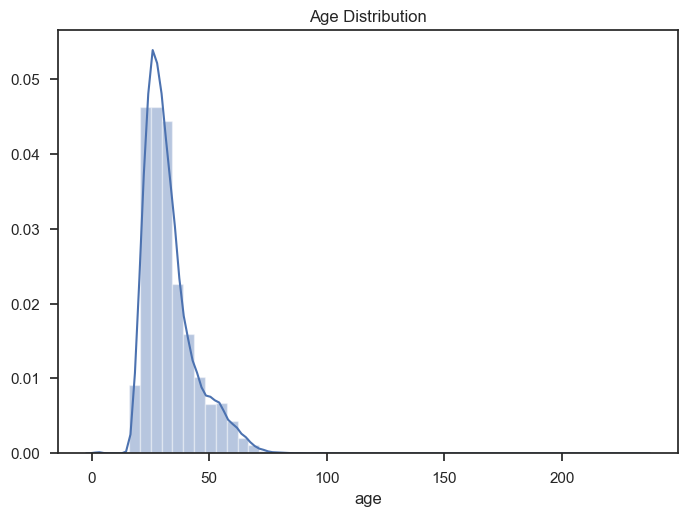

In [238]:
df_demo_age = df_demo_age.dropna()
sns.distplot(df_demo_age['age'])
plt.title('Age Distribution')

In [239]:
df_demo_nonan.head(2)

,wid,age,country,gender,marital,parenthood
0,1,37.0,USA,m,married,y
1,2,29.0,IND,m,married,y


In [240]:
import pandas_profiling

In [241]:
pandas_profiling.ProfileReport(df_demo_nonan)

Number of variables,7
Number of observations,10689
Total Missing (%),0.0%
Total size in memory,584.6 KiB
Average record size in memory,56.0 B
Numeric,1
Categorical,5
Boolean,0
Date,0
Text (Unique),0
Rejected,1


## By using the Pandas Profiling tool, we ascertain a much better understanding of the demographics of those individuals putting forth their happy moments. Key take aways are as follows: 

##### A. Slightly right skewed age distribution, with the mean centering around 25. 
##### B. Overwhelming majority of the individuals are American (~86%), followed by individuals who are Indian (9%).
##### C. Almost 50-50 split between males and females. 
##### D. Slightly above 50% of those individuals sampled are single, followed by ~40% of individuals who are married, lastly followed by ~5% of individuals who are divorced. 
##### E. ~60% of those sampled do not have children, while ~40% of those sampled do have children. 


## Part II: What observations can we make about individuals' happy moments from a peripheral level?

#### Now that we have an understanding of those individuals whose happy moments comprise our corpus, it would be beneficial to identify certain facts about the happy moments themselves. 

#### The other two datasets provided in the analysis can help provide us with this information. 

/Users/matthewvitha/anaconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Text(0.5,1,'Length of Happy Moment - Distribution')

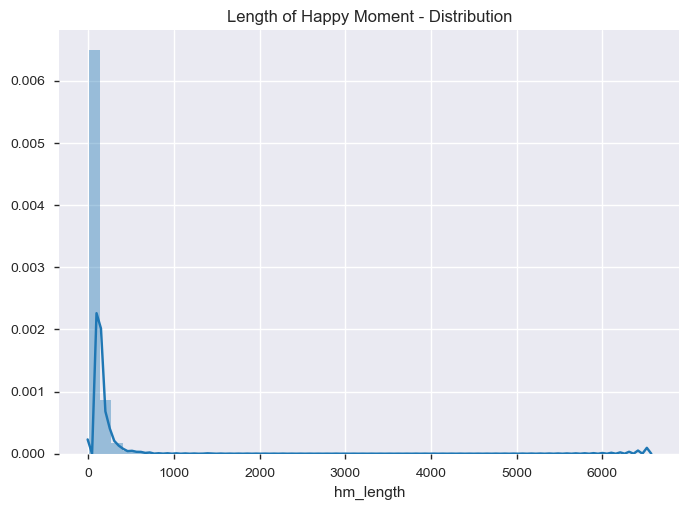

In [242]:
df['hm_length']  = df['cleaned_hm'].str.len()
sns.distplot(df['hm_length'])
plt.title('Length of Happy Moment - Distribution')

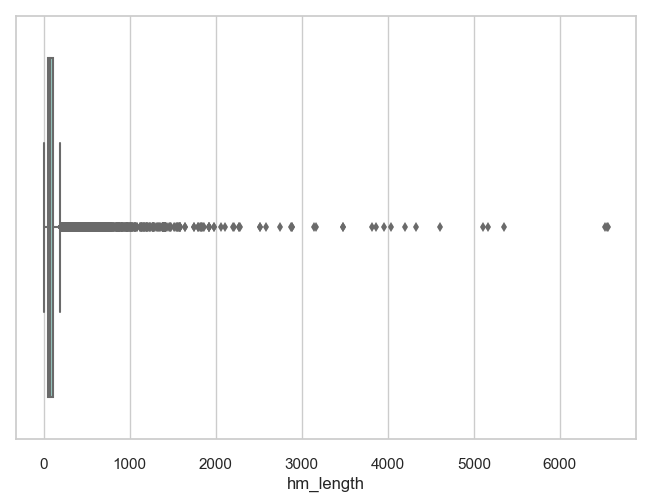

In [243]:
sns.set(style="whitegrid")
ax = sns.boxplot(x="hm_length", hue="reflection_period",data=df, palette="Set3")

## From the above two plots, we see that the majority of happy moments are under 1000 words, closer to 0 words than 1000. There remain a several outliers that persist in the 2000-6000 word range. 

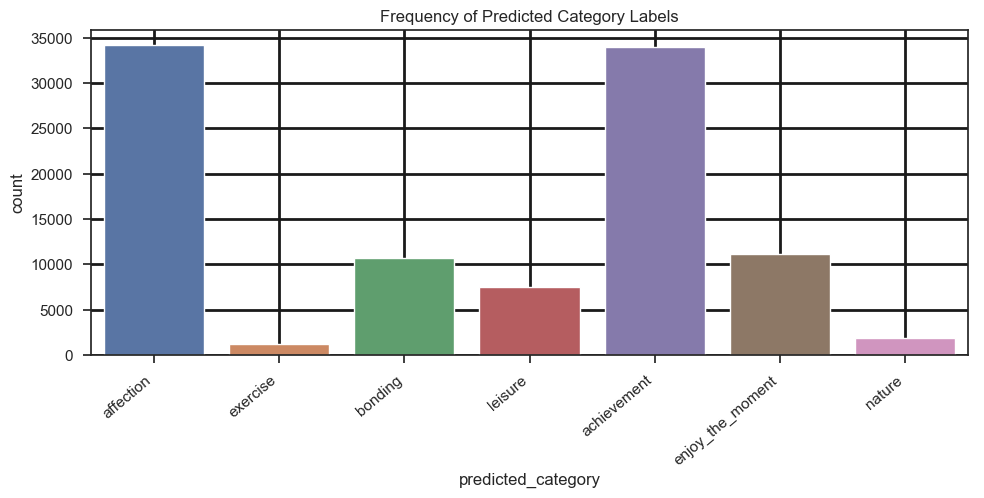

In [244]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="ticks", color_codes=True)

f, ax = plt.subplots(figsize=(10, 5))
ax = sns.countplot(x="predicted_category", data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.set_axisbelow(True)
plt.tight_layout()
plt.title("Frequency of Predicted Category Labels")
plt.grid(True, color='k', linestyle='-', linewidth=2)
plt.show()

###  We can make another interesting observation from the 'predicted_category' field from the cleaned_hm dataset (here noted as df). We see here that 'affection' and 'achievement' are by far the most predicted categories. These two are followed by 'bonding', 'enjoy_the_moment', and 'leisure'. 

##### 'nature' and 'exercise' by comparison, are the least frequent predicted category label. 

Text(0.5,1,'Length of Happy Moment by Predicted Category')

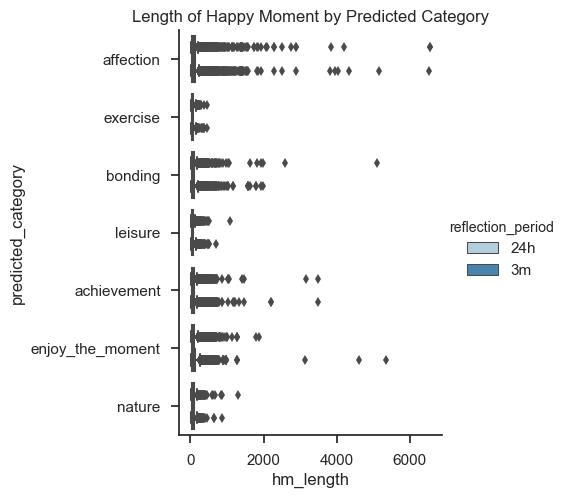

In [245]:
sns.catplot(x="hm_length", y="predicted_category",kind='box',hue='reflection_period', palette="Blues",data=df)
figsize=(50,50)
plt.title('Length of Happy Moment by Predicted Category')

## Analyzing the frequency of 'predicted_category' provides us with interesting observations. We can add a second layer to this analysis by comparing the frequency of 'predicted_category' with the length of the happy moments. 

## While the length of 'affection' matches that of what we would expect based on the previous chart, we notice that the length of achievement seems small compared to its frequency in the data. The length of 'achievement' is highly similar to that of 'enjoy_the_moment' and 'bonding'.

Text(0.5,1,'Frequency of Different POS')

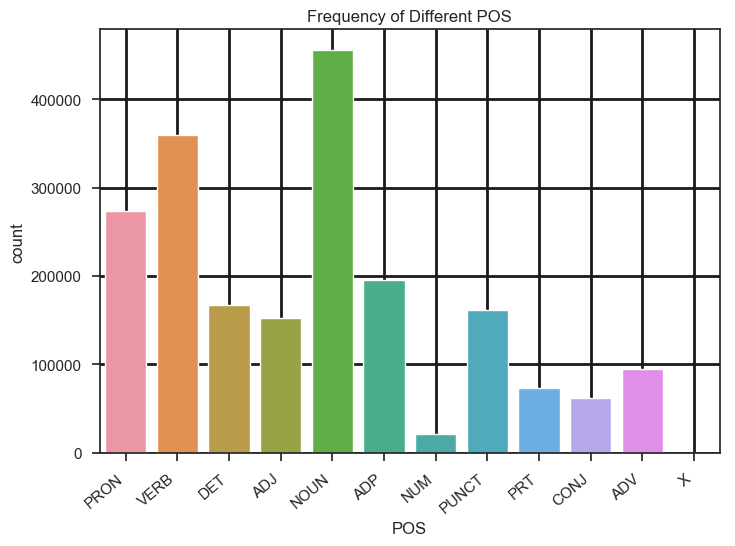

In [246]:
ax = sns.countplot(x="POS", data=df_sense)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.grid(True, color='k', linestyle='-', linewidth=2)
plt.title('Frequency of Different POS')

## From the above plot, we can see the frequencies of different POS throughout the dataset. Perhaps not surprisingly, 'Noun', 'Verb', and 'Pron' are the most frequent POS. This implies that people are happy when they interact with a state or object, or when they interact with other people involving states or objects. 

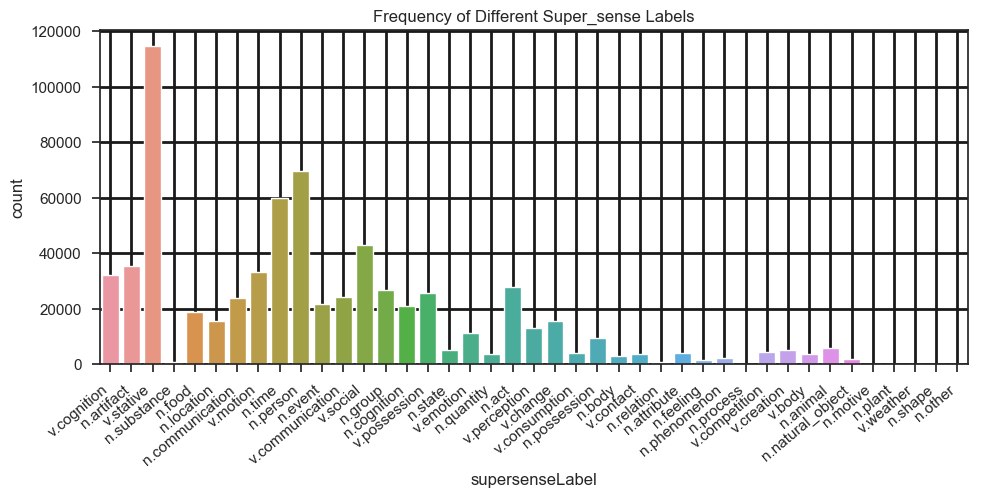

In [247]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="ticks", color_codes=True)

f, ax = plt.subplots(figsize=(10, 5))
ax = sns.countplot(x="supersenseLabel", data=df_sense)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.title("Frequency of Different Super_sense Labels")
plt.grid(True, color='k', linestyle='-', linewidth=2)
plt.show()

## Our observation from the above POS_histogram are confirmed by the supersenseLabel histogram depicted above. We see that 'v.stative', 'n.people', and 'n.time' contain the highest counts among all supersense labels. Moreover, we can infer that the most frequent happy moments involve spending time with other people aside from one's self, and that these actions entail a state of being/mind, rather than actions. 

## By looking at the plot however, we can also see that 'v.motion' and 'n.act' are present as well, allowing us to conclude that these two are also non-trivial in comprising happy moments. 

## Now that we have analyzed the demographics behind the people who provided their happy moments, and the actual happy moments themselves, we can try to algorithmically identify which happy moments are grouped together. 

## To accomplish this task, we implement the below algorithms:

### A. TF_IDF Vectorization
### B. K_Means Clustering
### C. LDA Topic Modeling 

## Before we implement algorithms to analyze the textual data comprising the happy moments, we must first pre-process the text data. Pre-processing steps entail:

### A. Turning all letters to lowercase
### B. Tokenizing the happy moments 
### C. Removing stop words from the happy moments 
### D. Lemmatizing the happy moments

In [248]:
import pandas as pd
df = pd.DataFrame(pd.read_csv('/Users/matthewvitha/Downloads/cleaned_hm.csv'))


In [249]:
import string
df['cleaned_hm'] = [i.lower() for i in df['cleaned_hm']]
#new_list = [expression(i) for i in old_list if filter(i)]

In [250]:
df['cleaned_hm'] = [i.translate(string.punctuation) for i in df['cleaned_hm']]

In [251]:

import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re

def preprocess(sentence):
	sentence = sentence.lower()
	tokenizer = RegexpTokenizer(r'\w+')
	tokens = tokenizer.tokenize(sentence)
	filtered_words = [w for w in tokens if not w in stopwords.words('english')]
	return " ".join(filtered_words)

In [326]:
df_small = df[:]

In [327]:
df_small['cleaned_hm'] = [preprocess(x) for x in df_small['cleaned_hm']]

In [328]:
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
lemmatizer=WordNetLemmatizer()
df_small['cleaned_hm'] = [lemmatizer.lemmatize(word) for word in df_small['cleaned_hm']]

In [329]:
from nltk.tokenize import regexp_tokenize, wordpunct_tokenize, blankline_tokenize
lemma=nltk.stem.WordNetLemmatizer()

lemma_books = []
for book in df_small['cleaned_hm']:
    lemma_book = [lemma.lemmatize(word) for word in wordpunct_tokenize(book)]
    lemma_book = (' ').join(lemma_book)
    lemma_books.append(lemma_book)

## Now that the textual data has been preprocessed, we can proceed with our TF_IDF vectorization of the corpus. We will use sklearn's TfidfVectorizer to accomplish this task. 

#### Note: Grid searching for optimal parameters of these algorithms was out_of_scope for this study. 

In [330]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
dtm = vectorizer.fit_transform(lemma_books).toarray()
vocab = np.array(vectorizer.get_feature_names())
dtm.shape

(100535, 22233)

## By creating a dictionary of the vectorized featre names and vectorizer.idf, we can create a data frame that shows different scores from the vectorization. 

### Not surprisingly, 'happy', 'got', 'went', 'made', and 'friend', were all some of the most frequently accounted for words in the corpus' vocabulary. The frequency of these words contrasts with 'rainbow' and 'tulip', which were used much more infrequently. This seems appropriate given that these nouns do not occur frequently in everyday life. 

In [331]:
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(
                    dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

In [332]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(10)

,tfidf
happy,2.782197
got,3.055617
made,3.235052
friend,3.291565
went,3.384920
time,3.445470
day,3.456779
new,3.478126
work,3.604990
last,3.788712


In [333]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(10)

,tfidf
dyslexic,11.825124
haan,11.825124
esque,11.825124
burdwan,11.825124
ecig,11.825124
politically,11.825124
hematologist,11.825124
ethereal,11.825124
sisteras,11.825124
ethan,11.825124


In [334]:
from sklearn.decomposition import TruncatedSVD

In [335]:
n_comp=7

In [336]:
vz_sample = vectorizer.fit_transform(list(lemma_books))

## We can plot our vectorized corpus using the Truncated SVD and TSNE models (set to two components for a 2-d view). 7 components were chosen given that there are 7 predicted cateogry labels. 

In [337]:
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf = svd.fit_transform(vz_sample)


In [338]:
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=250)

In [339]:
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100535 samples in 0.117s...
[t-SNE] Computed neighbors for 100535 samples in 22.622s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100535
[t-SNE] Computed conditional probabilities for sample 2000 / 100535
[t-SNE] Computed conditional probabilities for sample 3000 / 100535
[t-SNE] Computed conditional probabilities for sample 4000 / 100535
[t-SNE] Computed conditional probabilities for sample 5000 / 100535
[t-SNE] Computed conditional probabilities for sample 6000 / 100535
[t-SNE] Computed conditional probabilities for sample 7000 / 100535
[t-SNE] Computed conditional probabilities for sample 8000 / 100535
[t-SNE] Computed conditional probabilities for sample 9000 / 100535
[t-SNE] Computed conditional probabilities for sample 10000 / 100535
[t-SNE] Computed conditional probabilities for sample 11000 / 100535
[t-SNE] Computed conditional probabilities for sample 12000 / 100535
[t-SNE] Computed conditional probab

In [340]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook, reset_output
from bokeh.palettes import d3
import bokeh.models as bmo
from bokeh.io import save, output_file
output_notebook()

plot_tfidf = bp.figure(plot_width=700, plot_height=600,
                       title="tf-idf clustering of the item description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)


Loading BokehJS ...

In [341]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])

In [342]:
tfidf_df['description'] = lemma_books

In [343]:
plot_tfidf.scatter(x='x', y='y', source=tfidf_df, alpha=0.7)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"description": "@description"}
show(plot_tfidf)

## Using the bokeh library, we can develop a scatter plot visualization showing each happy moment and it's description. The Tf_idf algorithm does an adequate job in separating each happy moment into clusters. 



## But can we do better? The below cells detail the use of the MiniBatchKmeans algorithm to cluster our happy moments together. This time, 13 clusters are used as the results were semantically better than compared to using 7 clusters used previously. 

In [344]:
from sklearn.cluster import MiniBatchKMeans

num_clusters = 13 # need to be selected wisely
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, verbose=0, max_iter=250)

In [345]:
kmeans = kmeans_model.fit(vz_sample)
kmeans_clusters = kmeans.predict(vz_sample)
kmeans_distances = kmeans.transform(vz_sample)
# reduce dimension to 2 using tsne
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100535 samples in 0.251s...
[t-SNE] Computed neighbors for 100535 samples in 120.761s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100535
[t-SNE] Computed conditional probabilities for sample 2000 / 100535
[t-SNE] Computed conditional probabilities for sample 3000 / 100535
[t-SNE] Computed conditional probabilities for sample 4000 / 100535
[t-SNE] Computed conditional probabilities for sample 5000 / 100535
[t-SNE] Computed conditional probabilities for sample 6000 / 100535
[t-SNE] Computed conditional probabilities for sample 7000 / 100535
[t-SNE] Computed conditional probabilities for sample 8000 / 100535
[t-SNE] Computed conditional probabilities for sample 9000 / 100535
[t-SNE] Computed conditional probabilities for sample 10000 / 100535
[t-SNE] Computed conditional probabilities for sample 11000 / 100535
[t-SNE] Computed conditional probabilities for sample 12000 / 100535
[t-SNE] Computed conditional proba

In [346]:
#combined_sample.reset_index(drop=True, inplace=True)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['description'] = tfidf_df['description']

#kmeans_df['cluster']=kmeans_df.cluster.astype(str).astype('category')

In [347]:
plot_kmeans = bp.figure(plot_width=700, plot_height=600,
                        title="KMeans clustering of the description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

In [348]:
label_color_map = {0:'lightgrey',
                1:'lightcoral',
                2:'sandybrown',
                3:'papayawhip',
                4:'lemonchiffon',
                5:'darkkhaki',
                6:'yellow',
                7:'greenyellow',
                8:'lightgreen',
                9:'aquamarine',
                10:'darkkhaki',
                11:'deepskyblue',
                12:'dodgerblue',
                13:'navy',
                14:'blueviolet'}




#### label colors here: https://stackoverflow.com/questions/22408237/named-colors-in-matplotlib

In [349]:
label_color = [label_color_map[l] for l in kmeans_model.labels_] 

In [350]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from bokeh.models import HoverTool, DatetimeTickFormatter,ColumnDataSource
source = ColumnDataSource(data=dict(x=kmeans_df['x'], y=kmeans_df['y'],
                                    #color=colormap[kmeans_clusters],
                                    color=label_color,
                                    description=kmeans_df['description'],
                                    cluster=kmeans_df['cluster']))

plot_kmeans.scatter(x='x', y='y', color='color', source=source)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"description": "@description"}
show(plot_kmeans)

## We see that the Kmeans algorithm does a much better job in clearly separating the happy moments from those that are dissimilar to it. The clusters are color coded and are clearly separable. 

## By looking at the descriptions, we can observe that the Kmeans algorithm significantly takes into account verbs when clustering the data. i.e. made, went. 

### Below, we see words associated with the first 12 clusters. 

In [351]:
common_words = kmeans_model.cluster_centers_.argsort()[:,-1:-11:-1]
for num, centroid in enumerate(common_words):
    print(str(num) + ' : ' + ', '.join(vocab[word] for word in centroid))

0 : work, found, happy, today, daughter, received, week, dinner, last, favorite
1 : went, shopping, movie, friend, temple, family, dinner, walk, see, restaurant
2 : birthday, party, friend, great, celebrated, family, celebrate, gift, happy, surprise
3 : moment, life, happiest, happy, day, month, family, friend, last, one
4 : good, really, got, friend, night, made, dinner, work, ate, happy
5 : home, came, work, got, day, happy, husband, brought, made, wife
6 : friend, day, old, best, got, last, happy, met, school, mother
7 : made, happy, event, month, dinner, last, today, past, work, feel
8 : got, new, job, bought, work, car, happy, promotion, today, raise
9 : able, get, work, son, time, go, happy, day, sleep, friend
10 : time, long, first, spent, friend, got, spend, happy, family, year
11 : game, video, played, playing, play, friend, baseball, team, new, basketball
12 : dog, walk, took, got, happy, park, played, went, playing, new


## Lastly, we can implement a LDA topic model to see if it performs better than our Kmeans clustering. 

## For this analysis, 9 topics were chosen as this number generated more clearly seprable topics than 7 as used in Tf_idf, and 13 as used in Kmeans. 

In [352]:
from sklearn.decomposition import LatentDirichletAllocation

In [353]:
from sklearn.feature_extraction.text import CountVectorizer
# LDA can only use raw term counts for LDA because it is a probabilistic graphical model

no_features = 1000

tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tf = tf_vectorizer.fit_transform(lemma_books)
tf_feature_names = tf_vectorizer.get_feature_names()

In [354]:
no_topics = 9

lda = LatentDirichletAllocation(n_topics=no_topics, max_iter=5, learning_method='online', learning_offset=50.,random_state=0).fit(tf)

/Users/matthewvitha/anaconda/lib/python3.5/site-packages/sklearn/decomposition/online_lda.py:294: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)


In [355]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(topic_idx)
        print([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]])

In [356]:
no_top_words = 10
display_topics(lda, tf_feature_names, no_top_words)

0
['daughter', 'morning', 'husband', 'received', 'gave', 'little', 'big', 'early', 'today', 'company']
1
['week', 'month', 'new', 'getting', 'really', 'good', 'happy', 'got', 'ago', 'played']
2
['went', 'time', 'dinner', 'night', 'family', 'nice', 'birthday', 'dog', 'friend', 'took']
3
['car', 'love', 'thing', 'started', 'time', 'like', 'food', 'got', 'seeing', 'free']
4
['day', 'happy', 'son', 'home', 'going', 'felt', 'mother', 'work', 'came', 'got']
5
['new', 'got', 'job', 'bought', 'wife', 'event', 'work', 'told', 'trip', 'month']
6
['able', 'work', 'finally', 'happy', 'hour', 'money', 'past', 'finished', 'working', 'time']
7
['friend', 'old', 'year', 'favorite', 'game', 'happy', 'got', 'went', 'school', 'best']
8
['happy', 'moment', 'life', 'feel', 'house', 'make', 'saw', 'time', 'happiest', 'good']


In [357]:
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda, tf, tf_vectorizer)

/Users/matthewvitha/anaconda/lib/python3.5/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
2      14.624144        1       1  0.184638  0.060462
8      13.589084        1       2  0.211297 -0.019134
7      12.040811        1       3  0.143716 -0.037567
4      11.001033        1       4 -0.098554 -0.074089
5      10.630716        1       5 -0.310224 -0.142878
6      10.164791        1       6  0.078418 -0.087546
1       9.882209        1       7 -0.144142 -0.115436
3       9.518089        1       8  0.076010 -0.020136
0       8.549124        1       9 -0.141159  0.436325, topic_info=     Category          Freq          Term         Total  loglift  logprob
term                                                                     
209   Default  10378.000000           day  10378.000000  30.0000  30.0000
331   Default  10519.000000        friend  10519.000000  29.0000  29.0000
568   Default   9066.000000           new   9066.000000  28.0000  28.0000
966   Default   8874.000000          went   8874.000000  27.0000  27.0000
386   Default  18132.000000         happy  18132.000000  26.0000  26.0000
978   Default   8302.000000          work   8302.000000  25.0000  25.0000
356   Default  13349.000000           got  13349.000000  24.0000  24.0000
963   Default   4201.000000          week   4201.000000  23.0000  23.0000
11    Default   5207.000000          able   5207.000000  22.0000  22.0000
545   Default   4960.000000         month   4960.000000  21.0000  21.0000
208   Default   3508.000000      daughter   3508.000000  20.0000  20.0000
801   Default   3623.000000           son   3623.000000  19.0000  19.0000
307   Default   3439.000000       finally   3439.000000  18.0000  18.0000
543   Default   3619.000000        moment   3619.000000  17.0000  17.0000
479   Default   3619.000000          life   3619.000000  16.0000  16.0000
547   Default   2901.000000       morning   2901.000000  15.0000  15.0000
438   Default   3091.000000           job   3091.000000  14.0000  14.0000
420   Default   2736.000000       husband   2736.000000  13.0000  13.0000
94    Default   2977.000000        bought   2977.000000  12.0000  12.0000
409   Default   4306.000000          home   4306.000000  11.0000  11.0000
582   Default   3033.000000           old   3033.000000  10.0000  10.0000
224   Default   3290.000000        dinner   3290.000000   9.0000   9.0000
967   Default   2753.000000          wife   2753.000000   8.0000   8.0000
292   Default   2900.000000      favorite   2900.000000   7.0000   7.0000
287   Default   4488.000000        family   4488.000000   6.0000   6.0000
352   Default   2651.000000         going   2651.000000   5.0000   5.0000
690   Default   5254.000000        really   5254.000000   4.0000   4.0000
341   Default   2458.000000       getting   2458.000000   3.0000   3.0000
693   Default   2301.000000      received   2301.000000   2.0000   2.0000
572   Default   3604.000000         night   3604.000000   1.0000   1.0000
...       ...           ...           ...           ...      ...      ...
243    Topic9   1115.331516         early   1116.228810   2.4585  -3.8578
166    Topic9    904.210595       company    905.107951   2.4583  -4.0676
158    Topic9    904.031625        coffee    904.928858   2.4583  -4.0678
974    Topic9    891.040872          woke    891.938050   2.4583  -4.0823
792    Topic9    802.051899         small    802.949301   2.4582  -4.1875
554    Topic9    764.241382         mturk    765.138690   2.4582  -4.2358
507    Topic9    713.845301          mail    714.751959   2.4581  -4.3040
473    Topic9    674.193288          left    675.091101   2.4580  -4.3611
538    Topic9    660.894632        minute    661.792019   2.4580  -4.3811
18     Topic9    635.320293     afternoon    636.217646   2.4579  -4.4205
941    Topic9    608.194306       visited    609.091624   2.4579  -4.4642
736    Topic9    601.710799          sale    602.608117   2.4579  -4.4749
338    Topic9    548.735768      

## As seen in the above interactive bubble plot, the LDA model performs well in separating the happy moments into distinct topics.  

## However, given that the model has a difficult time clearly separating topics 1-3, which comprise the largest percentage of the vocabulary in the corpus, it is safe to say that the Kmeans clustering performs the best in terms of grouping happy moments together. 

In [358]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
from subprocess import check_output

In [359]:
df_small_a = df_small
cleaned_hm_a = [str(i) for i in df_small_a['cleaned_hm']]

In [360]:
letters_only = re.sub("[^a-zA-Z]",  # Search for all non-letters
                          " ",          # Replace all non-letters with spaces
                          str(df_small_a['cleaned_hm']))

In [361]:
wordcloud = WordCloud(width = 15000, height = 2000, 
                background_color ='grey',max_words=100,  
                min_font_size = 10).generate(letters_only)

## The word cloud below helps us to close out thisn project! Thanks for your time and attention!

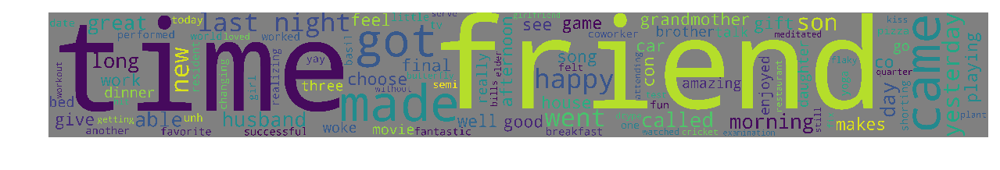

In [362]:
print(wordcloud)
fig = plt.figure(1)
fig.set_size_inches(15.5, 7.5)
#fig.savefig('test2png.png', dpi=100)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()